In [3]:
!pip install pytorch_msssim

In [4]:
import os
import cv2
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from google.colab import drive
from torch.amp import autocast
from skimage.metrics import peak_signal_noise_ratio
from torchvision.models import vgg16
from pytorch_msssim import SSIM
import torchvision.transforms as transforms

In [5]:
# Mount Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
# Paths
#model_path = '/content/drive/MyDrive/bi_msaae_model_sigma15_256x256_best.pth'

model_path = '/content/drive/MyDrive/bimsaae_checkpoints/bimsaae_final.pth'
input_video_path = '/content/drive/MyDrive/cleanvideo.mp4'  # Adjust path to your video
output_dir = '/content/drive/MyDrive/denoising_video_samples'
os.makedirs(output_dir, exist_ok=True)

In [7]:

# BiMSAAE Model for Grayscale
class MultiScaleEncoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.branch3x3 = nn.Sequential(
            nn.Conv2d(1, 126, kernel_size=3, padding=1),
            nn.BatchNorm2d(126),
            nn.ReLU(inplace=True),
            nn.Conv2d(126, 126, kernel_size=3, padding=1),
            nn.BatchNorm2d(126),
            nn.ReLU(inplace=True)
        )
        self.branch5x5 = nn.Sequential(
            nn.Conv2d(1, 126, kernel_size=5, padding=2),
            nn.BatchNorm2d(126),
            nn.ReLU(inplace=True),
            nn.Conv2d(126, 126, kernel_size=5, padding=2),
            nn.BatchNorm2d(126),
            nn.ReLU(inplace=True)
        )
        self.residual = nn.Conv2d(1, 252, kernel_size=1)
        self.checkpoint_segments = 2

    def forward(self, x):
        f1 = self.branch3x3(x)
        f2 = self.branch5x5(x)
        res = self.residual(x)
        return torch.cat([f1, f2], dim=1) + res

class NoiseGateModule(nn.Module):
    def __init__(self, in_channels=252):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, 1, kernel_size=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        mask = self.conv(x)
        mask = self.sigmoid(mask)
        return x * mask

class ChannelAttentionBlock(nn.Module):
    def __init__(self, in_channels=252):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.conv = nn.Conv2d(in_channels * 2, in_channels, kernel_size=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.avg_pool(x)
        max_out = self.max_pool(x)
        pooled = torch.cat([avg_out, max_out], dim=1)
        attn = self.conv(pooled)
        attn = self.sigmoid(attn)
        return x * attn

class DualHeadDecoder(nn.Module):
    def __init__(self, in_channels=252):
        super().__init__()
        self.structural_head = nn.Sequential(
            nn.Conv2d(in_channels, 126, kernel_size=3, padding=1),
            nn.BatchNorm2d(126),
            nn.ReLU(inplace=True),
            nn.Conv2d(126, 63, kernel_size=3, padding=1),
            nn.BatchNorm2d(63),
            nn.ReLU(inplace=True),
            nn.Conv2d(63, 33, kernel_size=3, padding=1),
            nn.BatchNorm2d(33),
            nn.ReLU(inplace=True),
            nn.Conv2d(33, 15, kernel_size=3, padding=1),
            nn.BatchNorm2d(15),
            nn.ReLU(inplace=True),
            nn.Conv2d(15, 1, kernel_size=3, padding=1),
            nn.BatchNorm2d(1)
        )
        self.texture_head = nn.Sequential(
            nn.Conv2d(in_channels, 126, kernel_size=5, padding=2),
            nn.BatchNorm2d(126),
            nn.ReLU(inplace=True),
            nn.Conv2d(126, 63, kernel_size=5, padding=2),
            nn.BatchNorm2d(63),
            nn.ReLU(inplace=True),
            nn.Conv2d(63, 33, kernel_size=5, padding=2),
            nn.BatchNorm2d(33),
            nn.ReLU(inplace=True),
            nn.Conv2d(33, 15, kernel_size=5, padding=2),
            nn.BatchNorm2d(15),
            nn.ReLU(inplace=True),
            nn.Conv2d(15, 1, kernel_size=5, padding=2),
            nn.BatchNorm2d(1)
        )
        self.alpha = nn.Parameter(torch.tensor(0.6))
        self.checkpoint_segments = 2

    def forward(self, x):
        struct = self.structural_head(x)
        text = self.texture_head(x)
        return self.alpha * struct + (1 - self.alpha) * text

class SharpeningModule(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv = nn.Conv2d(1, 1, kernel_size=3, padding=1, bias=False)
        laplacian = torch.tensor([[[[0, -1, 0], [-1, 4, -1], [0, -1, 0]]]], dtype=torch.float32)
        self.conv.weight = nn.Parameter(laplacian)
        self.strength = nn.Parameter(torch.tensor(0.7))

    def forward(self, x):
        edges = self.conv(x)
        return x + self.strength * edges

class BiMSAAE(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = MultiScaleEncoder()
        self.noise_gate = NoiseGateModule()
        self.attention = ChannelAttentionBlock()
        self.decoder = DualHeadDecoder()
        self.sharpen = SharpeningModule()
        self.skip_conv = nn.Conv2d(252, 252, kernel_size=1)

    def forward(self, x):
        f = self.encoder(x)
        skip = self.skip_conv(f)
        f = self.noise_gate(f)
        f = self.attention(f)
        f = f + skip
        out = self.decoder(f)
        out = torch.sigmoid(out)
        out = self.sharpen(out)
        return torch.clamp(out, 0, 1)

In [8]:
# Load the trained model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = BiMSAAE().to(device)
try:
    model.load_state_dict(torch.load(model_path, map_location=device))
    print("Model loaded successfully.")
except RuntimeError as e:
    print(f"Error loading model: {e}")
    exit()
model.eval()

Model loaded successfully.


BiMSAAE(
  (encoder): MultiScaleEncoder(
    (branch3x3): Sequential(
      (0): Conv2d(1, 126, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(126, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(126, 126, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(126, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
    (branch5x5): Sequential(
      (0): Conv2d(1, 126, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): BatchNorm2d(126, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(126, 126, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (4): BatchNorm2d(126, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
    (residual): Conv2d(1, 252, kernel_size=(1, 1), stride=(1, 1))
  )
  (noise_gate): Noi

In [10]:
from torchvision import transforms

transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor()
])

In [11]:
# Function to add Gaussian noise
def add_gaussian_noise(frame, sigma=15/255.0):
    frame_np = frame.cpu().numpy().squeeze(0)
    noise = np.random.normal(0, sigma, frame_np.shape)
    noisy_frame = np.clip(frame_np + noise, 0, 1)
    return torch.tensor(noisy_frame, dtype=torch.float32).unsqueeze(0).to(device)

In [13]:
import cv2

video_path = '/content/drive/MyDrive/cleanvideo.mp4'
cap = cv2.VideoCapture(video_path)

fps = cap.get(cv2.CAP_PROP_FPS)

In [14]:
output_dir = '/content/drive/MyDrive/'

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
clean_writer = cv2.VideoWriter(os.path.join(output_dir, 'clean_video_bw.mp4'), fourcc, fps, (256, 256), isColor=False)
noisy_writer = cv2.VideoWriter(os.path.join(output_dir, 'noisy_video_bw.mp4'), fourcc, fps, (256, 256), isColor=False)
denoised_writer = cv2.VideoWriter(os.path.join(output_dir, 'denoised_video_bw.mp4'), fourcc, fps, (256, 256), isColor=False)

In [17]:
# Process video frame by frame
cap = cv2.VideoCapture(input_video_path)
if not cap.isOpened():
    raise FileNotFoundError(f"Could not open video: {input_video_path}")

psnr_clean_noisy, psnr_clean_denoised = [], []
fps = cap.get(cv2.CAP_PROP_FPS)
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
sample_idx = frame_count // 2
sample_clean, sample_noisy, sample_denoised = None, None, None
frame_idx = 0

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    # Resize to 256x256
    frame = cv2.resize(frame, (256, 256))
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frame_pil = Image.fromarray(frame_rgb)
    frame_tensor = transform(frame_pil).to(device)

    # Add noise
    noisy_frame = add_gaussian_noise(frame_tensor)

    # Denoise
    with autocast(device_type='cuda'):
        denoised_frame = model(noisy_frame.unsqueeze(0)).squeeze(0)

    # Convert to NumPy for metrics and video writing
    clean_np = frame_tensor.cpu().numpy().squeeze(0)
    noisy_np = noisy_frame.cpu().numpy().squeeze(0)
    denoised_np = denoised_frame.detach().cpu().numpy().squeeze(0)

    # Calculate PSNR
    psnr_cn = peak_signal_noise_ratio(clean_np, noisy_np, data_range=1.0)
    psnr_cd = peak_signal_noise_ratio(clean_np, denoised_np, data_range=1.0)
    psnr_clean_noisy.append(psnr_cn)
    psnr_clean_denoised.append(psnr_cd)

    # Write frames directly to video
    clean_writer.write((clean_np * 255).astype(np.uint8))
    noisy_writer.write((noisy_np * 255).astype(np.uint8))
    denoised_writer.write((denoised_np * 255).astype(np.uint8))

    # Save sample frame for triplet visualization
    if frame_idx == sample_idx:
        sample_clean = clean_np
        sample_noisy = noisy_np
        sample_denoised = denoised_np

    # Clear memory
    del frame_tensor, noisy_frame, denoised_frame, clean_np, noisy_np, denoised_np
    torch.cuda.empty_cache()
    frame_idx += 1

cap.release()
clean_writer.release()
noisy_writer.release()
denoised_writer.release()

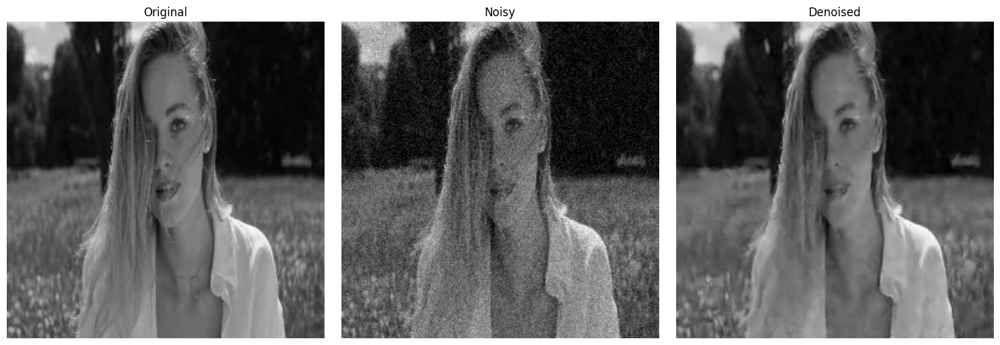

In [21]:
import cv2
import matplotlib.pyplot as plt

# Paths to your videos
original_path = "/content/drive/MyDrive/clean_video_bw.mp4"
noisy_path = "/content/drive/MyDrive/noisy_video_bw.mp4"
denoised_path = "/content/drive/MyDrive/denoised_video_bw.mp4"

def read_first_grayscale_frame(video_path):
    cap = cv2.VideoCapture(video_path)
    ret, frame = cap.read()
    cap.release()
    if not ret:
        raise ValueError(f"Could not read frame from: {video_path}")
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    return gray

# Read first frames
frame_original = read_first_grayscale_frame(original_path)
frame_noisy = read_first_grayscale_frame(noisy_path)
frame_denoised = read_first_grayscale_frame(denoised_path)

# Plot all 3 frames side-by-side
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(frame_original, cmap='gray')
plt.title("Original")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(frame_noisy, cmap='gray')
plt.title("Noisy")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(frame_denoised, cmap='gray')
plt.title("Denoised")
plt.axis('off')

plt.tight_layout()
plt.show()

In [20]:
# Print average PSNR
avg_psnr_clean_noisy = np.mean(psnr_clean_noisy)
avg_psnr_clean_denoised = np.mean(psnr_clean_denoised)
print(f"Average PSNR (Clean vs Noisy): {avg_psnr_clean_noisy:.2f} dB")
print(f"Average PSNR (Clean vs Denoised): {avg_psnr_clean_denoised:.2f} dB")
print(f"Grayscale videos and plots saved to {output_dir}")

Average PSNR (Clean vs Noisy): 24.85 dB
Average PSNR (Clean vs Denoised): 28.87 dB
Grayscale videos and plots saved to /content/drive/MyDrive/


In [31]:
import os
import subprocess
from IPython.display import Video, display, HTML

local_dir = '/content/drive/MyDrive'

def reencode_to_h264(input_path, output_path):
    cmd = [
        'ffmpeg', '-y', '-i', input_path, '-c:v', 'libx264',
        '-profile:v', 'baseline', '-level', '3.0', '-preset', 'fast',
        '-crf', '23', '-c:a', 'aac', '-b:a', '128k', output_path
    ]
    try:
        subprocess.run(cmd, check=True, capture_output=True)
        print(f"Re-encoded video saved at: {output_path}")
    except subprocess.CalledProcessError as e:
        print(f"FFmpeg error while processing {input_path}:\n{e.stderr.decode()}")
        raise

video_files = ['clean_video_bw.mp4', 'noisy_video_bw.mp4', 'denoised_video_bw.mp4']
reencoded_files = []

for video_file in video_files:
    src_path = os.path.join(local_dir, video_file)
    dst_path = os.path.join(local_dir, 'reencoded_' + video_file)

    if not os.path.exists(src_path):
        print(f"File not found: {src_path}, skipping...")
        continue

    # Re-encode the video
    reencode_to_h264(src_path, dst_path)
    reencoded_files.append(dst_path)

# Generate HTML to display videos side by side with labels
html_content = '<div style="display: flex; justify-content: space-around; align-items: center;">'
for video_path in reencoded_files:
    label = os.path.basename(video_path).replace('.mp4', '').replace('_', ' ').title()
    html_content += f'''
    <div style="text-align: center; margin: 0 10px;">
        <div style="font-weight: bold; margin-bottom: 5px;">{label}</div>
        {Video(video_path, embed=True, width=400, height=400, html_attributes="controls")._repr_html_()}
    </div>
    '''
html_content += '</div>'
display(HTML(html_content))

Re-encoded video saved at: /content/drive/MyDrive/reencoded_clean_video_bw.mp4
Re-encoded video saved at: /content/drive/MyDrive/reencoded_noisy_video_bw.mp4
Re-encoded video saved at: /content/drive/MyDrive/reencoded_denoised_video_bw.mp4
